# Baseline 

#### Using the following paper: https://journals.sagepub.com/doi/epub/10.5772/56884

## Imports

In [1]:
import cv2
import time
import numpy as np
import pymeanshift as pms
import os
import pandas as pd
from matplotlib import pyplot as plt
from ipyfilechooser import FileChooser
from IPython.display import clear_output

## File Chooser

In [2]:
# Create and display a FileChooser widget
fc = FileChooser('C:\\Users\\cjbla\\OneDrive\\Desktop\\Code\\data\\dataset')
display(fc)

FileChooser(path='C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset', filename='', title='', show_hidden=False…

## Main Algorithm

### Mean Shift Segmentation Approach

https://medium.com/@muhammetbolat/image-segmentation-using-k-means-clustering-algorithm-and-mean-shift-clustering-algorithm-fb6ebe4cb761

In [31]:
def mean_shift(img, processing_shape=(256,256), spatial_radius=6, range_radius=4.5, min_density=50): 
    
    original_shape = img.shape
    img = cv2.resize(img, processing_shape)
    (segmented_image, labels_image, number_regions) = pms.segment(img, spatial_radius=spatial_radius, range_radius=range_radius, min_density=min_density)

    #take the upper half of labels_image and take the most dominant label in the upper half
    upper_labels = labels_image[0:labels_image.shape[0]//2, 0:labels_image.shape[1]]
    unique, counts = np.unique(upper_labels, return_counts=True)
    dominant_label = unique[np.argmax(counts)]

    #create a mask from labels_image where dominant_label is sky and resize it to original shape
    mask = np.zeros(labels_image.shape, dtype=np.uint8)
    mask[labels_image == dominant_label] = 1
    mask = cv2.resize(mask, (original_shape[1],original_shape[0]))

    print(labels_image)

    return mask, segmented_image, labels_image
    

#### Display Results

In [4]:
def display_results(filename, display_mode='display', data_mode = 'display', spatial_radius=4, range_radius=4, min_density= 50): 
    
    start_time = time.time()
    img = plt.imread(filename)
    mask, segmented_image, labels_image = mean_shift(img, spatial_radius=spatial_radius, range_radius=range_radius, min_density=min_density)
    time_taken = time.time() - start_time

    after_img = cv2.bitwise_and(img, img, mask=mask)

    #display the images in 2 subplots 
    if display_mode == 'display':
        print('------------------------------------------------------------------------------------------------------------------------')
        print("Processing: " + filename.split("\\")[-2] + ", spatial_radius: " + str(spatial_radius) + ", range_radius: " + str(range_radius) + ", min_density: " + str(min_density))
        print('Time taken: ', time_taken)
        
        plt.title('Segmented Image')
        plt.imshow(segmented_image)
        plt.show()

        plt.title('Labels Image')
        plt.imshow(labels_image)
        plt.show()

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 5))
        fig.suptitle('Sky Segmentation')
        ax1.imshow(after_img)
        ax1.set_title('Result')
        ax2.imshow(plt.imread(filename))
        ax2.set_title('Original Image')
        plt.show()

        if data_mode == 'validate':
            val_image = cv2.imread("C:\\Users\\cjbla\\OneDrive\\Desktop\\Code\\data\\dataset\\ValidationImages\\Skyfinder\\" + filename.split("\\")[-2] + ".png")
            val_image = cv2.cvtColor(val_image, cv2.COLOR_BGR2GRAY)

            #calculate the precision and recall
            true_pos = np.sum(np.logical_and(val_image, mask))
            false_pos = np.sum(np.logical_and(np.logical_not(val_image), mask))
            false_neg = np.sum(np.logical_and(val_image, np.logical_not(mask)))
            precision = true_pos / (true_pos + false_pos)
            recall = true_pos / (true_pos + false_neg)
            f1 = 2 * (precision * recall) / (precision + recall)

            print("Precision: " + str(precision))
            print("Recall: " + str(recall))
            print("F1: " + str(f1))

            print('------------------------------------------------------------------------------------------------------------------------')
            return [precision, recall, f1, filename, time_taken, spatial_radius, range_radius, min_density]
        
        elif data_mode == 'display':
            print('------------------------------------------------------------------------------------------------------------------------')
            return [0, 0, 0, filename, time_taken, spatial_radius, range_radius, min_density]
        
    else:
        if data_mode == 'validate':
            val_image = cv2.imread("C:\\Users\\cjbla\\OneDrive\\Desktop\\Code\\data\\dataset\\ValidationImages\\Skyfinder\\" + filename.split("\\")[-2] + ".png")
            val_image = cv2.cvtColor(val_image, cv2.COLOR_BGR2GRAY)

            #calculate the precision and recall
            true_pos = np.sum(np.logical_and(val_image, mask))
            false_pos = np.sum(np.logical_and(np.logical_not(val_image), mask))
            false_neg = np.sum(np.logical_and(val_image, np.logical_not(mask)))
            precision = true_pos / (true_pos + false_pos)
            recall = true_pos / (true_pos + false_neg)
            f1 = 2 * (precision * recall) / (precision + recall)

            return [precision, recall, f1, filename, time_taken, spatial_radius, range_radius, min_density]
        
        elif data_mode == 'display':
            return [0, 0, 0, filename, time_taken, spatial_radius, range_radius, min_density]
        


#### Individual Image Testing

[[ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [78 78 78 ... 74 74 74]
 [78 78 78 ... 74 74 74]
 [78 78 78 ... 74 74 74]]
------------------------------------------------------------------------------------------------------------------------
Processing: 9483, spatial_radius: 2, range_radius: 8, min_density: 150
Time taken:  0.0615081787109375


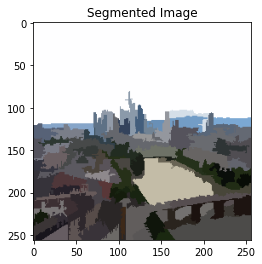

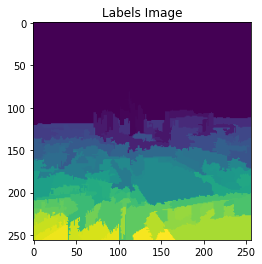

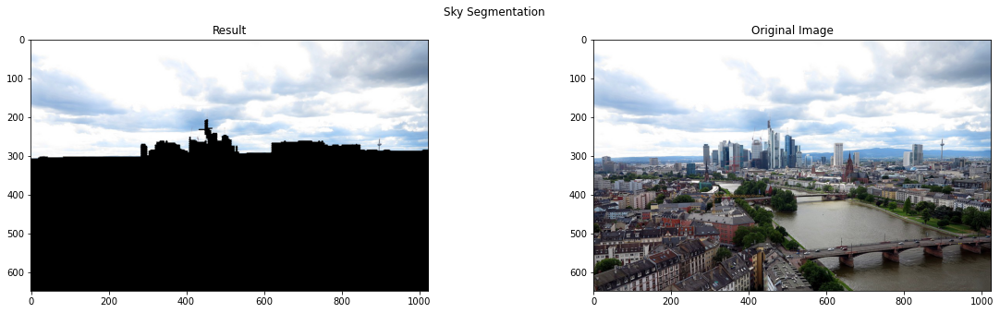

Precision: 0.9961977981382802
Recall: 0.9865093854505672
F1: 0.9913299207901564
------------------------------------------------------------------------------------------------------------------------


In [73]:
#for q in np.arange(0.02, 0.22, 0.02):
for k in np.arange(8, 9, 1):   
    _ = display_results(fc.selected, display_mode = 'display',data_mode='validate', spatial_radius=2, range_radius=8, min_density=150)

### Data for random 1000 images

In [8]:
sr_array = [i for i in range(0, 3, 1)]
rr_array = [i for i in range(2, 16, 2)]
min_array = [i for i in range(150, 550, 100)]

results = pd.DataFrame(columns=['precision', 'recall', 'f1', 'filename', 'time_taken', 'spatial_radius', 'range_radius', 'min_density'])

#iterate through 1000 random images
files = [os.path.join(dp, f) for dp, dn, filenames in os.walk("C:\\Users\\cjbla\\OneDrive\\Desktop\\Code\\data\\dataset\\OriginalImages") for f in filenames if os.path.splitext(f)[1] == '.jpg']
random = [np.random.randint(0, len(files)) for i in range(0, 100)]
counter = 0
for i in random:
    counter += 1
    for j in sr_array:
        for k in rr_array:
            for l in min_array:
                clear_output(wait=True)
                print("File Number " + str(counter) + "/100 - " + str(files[i]) + "\nspatial_radius=" + str(j) + ": \n     range_radius=" + str(k) + ": \n          min_density=" + str(l) + ": ")
                results.loc[len(results)] = display_results(files[i], display_mode = 'not_display' ,data_mode='validate', spatial_radius=j, range_radius=k, min_density=l)

#remove all nan values from results
results = results.dropna()

#save the results to a csv file
results.to_csv('C:\\Users\\cjbla\\OneDrive\\Desktop\\Code\\data\\dataset\\results_0_1.csv')

File Number 100/100 - C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset\OriginalImages\162\20130810_200826.jpg
spatial_radius=2: 
     range_radius=14: 
          min_density=450: 


In [77]:
#get the average precision, recall and f1 score for each spatial_radius
results1 = pd.read_csv('C:\\Users\\cjbla\\OneDrive\\Desktop\\Code\\data\\dataset\\results_0_1.csv')
results1 = results1.drop(columns=['Unnamed: 0'])
results1 = results1.dropna()
results1 = results1.reset_index(drop=True)
results1 = results1.astype({'precision': 'float64', 'recall': 'float64', 'f1': 'float64', 'time_taken': 'float64', 'spatial_radius': 'int64', 'range_radius': 'int64', 'min_density': 'int64'})
results1 = results1.groupby(['spatial_radius']).mean()

#print the results
print(results1)

                precision    recall        f1  time_taken  range_radius  \
spatial_radius                                                            
0                0.881341  0.830165  0.810149    0.013700      8.003597   
1                0.912586  0.885380  0.884910    0.043123      8.002865   
2                0.900342  0.933518  0.908471    0.055700      8.004309   

                min_density  
spatial_radius               
0                300.035971  
1                300.000000  
2                299.946140  


In [17]:
#make an interactive plot of the results for precision, recall, and time taken
import plotly.express as px
fig = px.scatter_3d(results, x='precision', y='recall', z='time_taken', color='filename', size_max=1, opacity=0.7)
fig.show()

### Importing the result data

In [90]:
sr_array = [i for i in range(2, 16, 2)]
rr_array = [i for i in range(2, 16, 2)]
min_array = [i for i in range(150, 550, 100)]

#import the results from the csv file with the first column as the index
results = pd.read_csv('C:\\Users\\cjbla\\OneDrive\\Desktop\\Code\\data\\dataset\\results.csv', index_col=0)

In [78]:
sr_array = [i for i in range(0, 3, 1)]

#import the results from the csv file with the first column as the index
results = pd.read_csv('C:\\Users\\cjbla\\OneDrive\\Desktop\\Code\\data\\dataset\\results_0_1.csv', index_col=0)

### Display the results in 3D

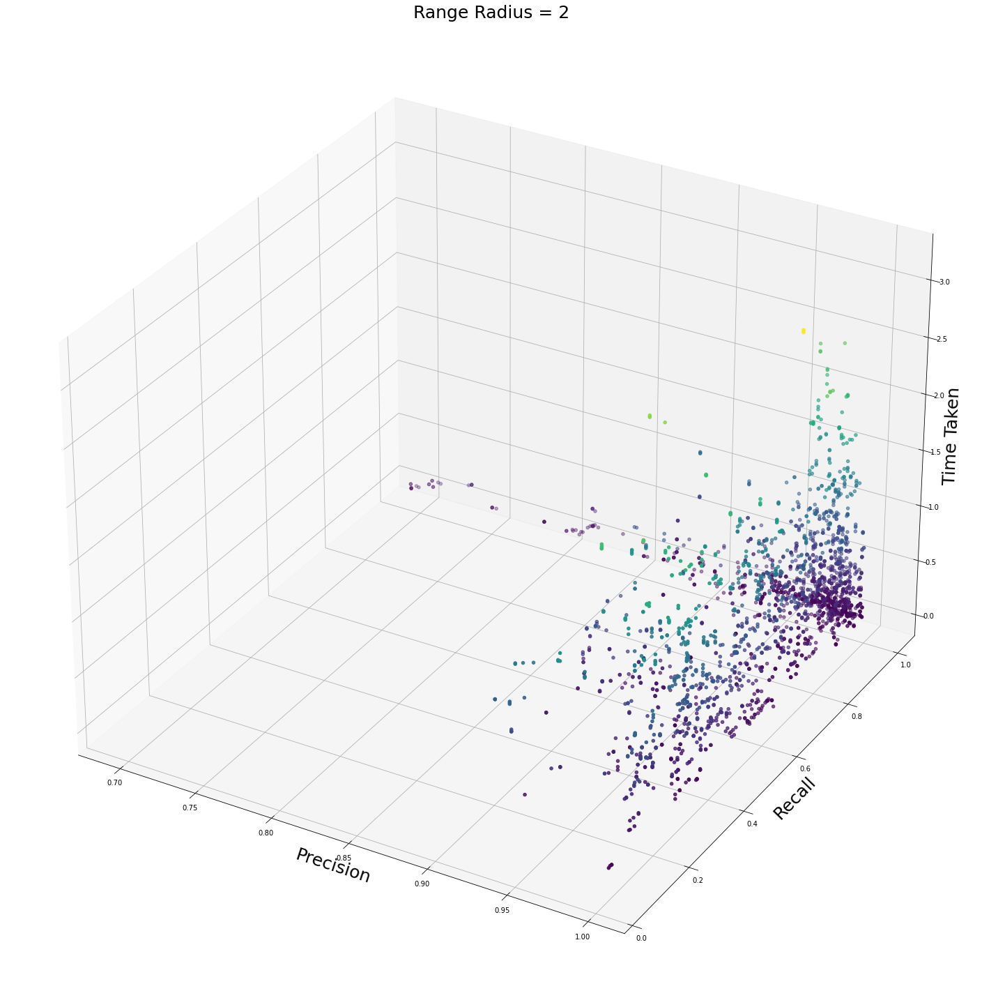

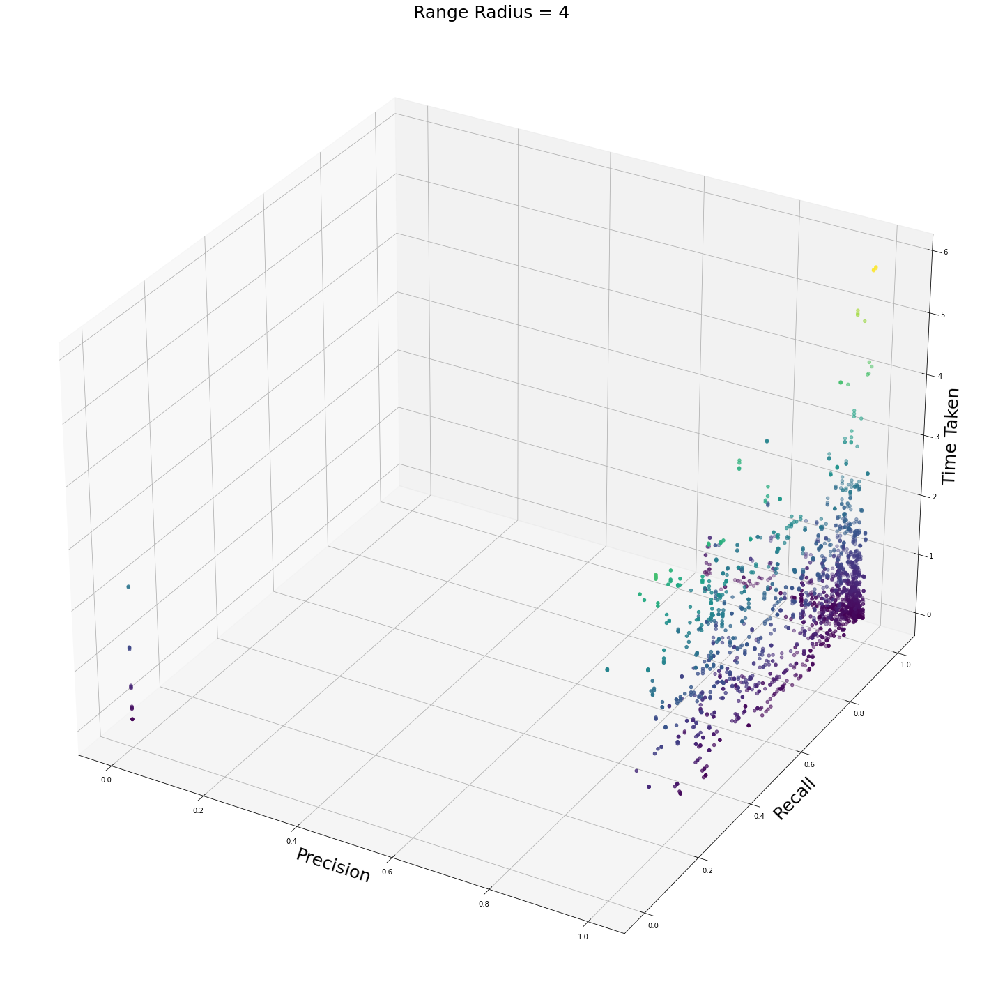

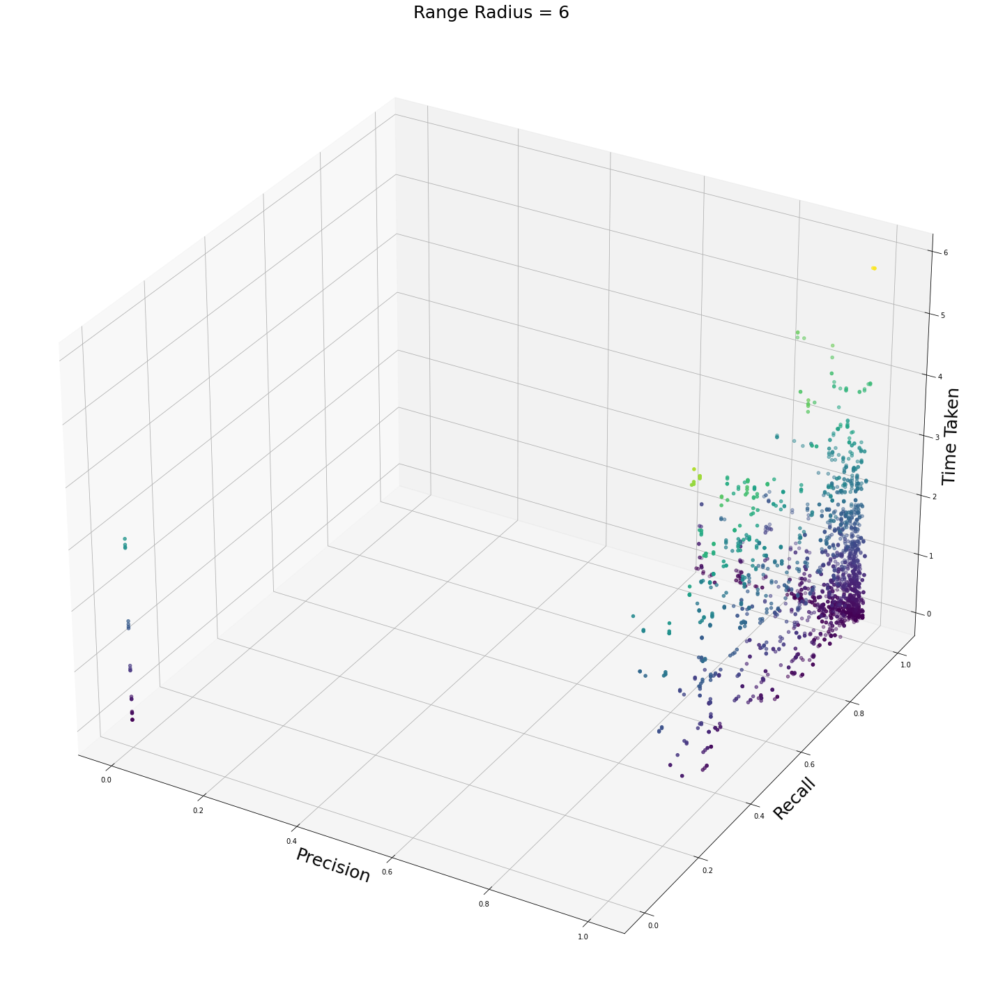

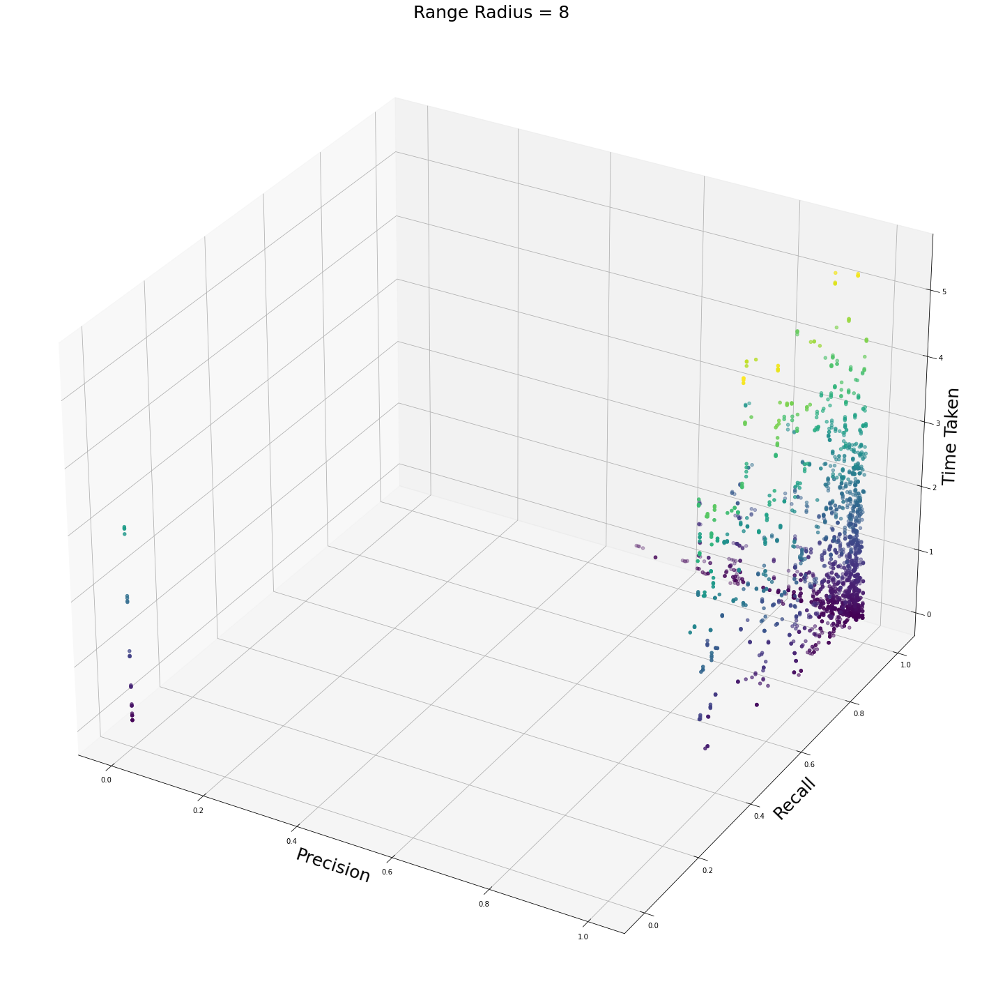

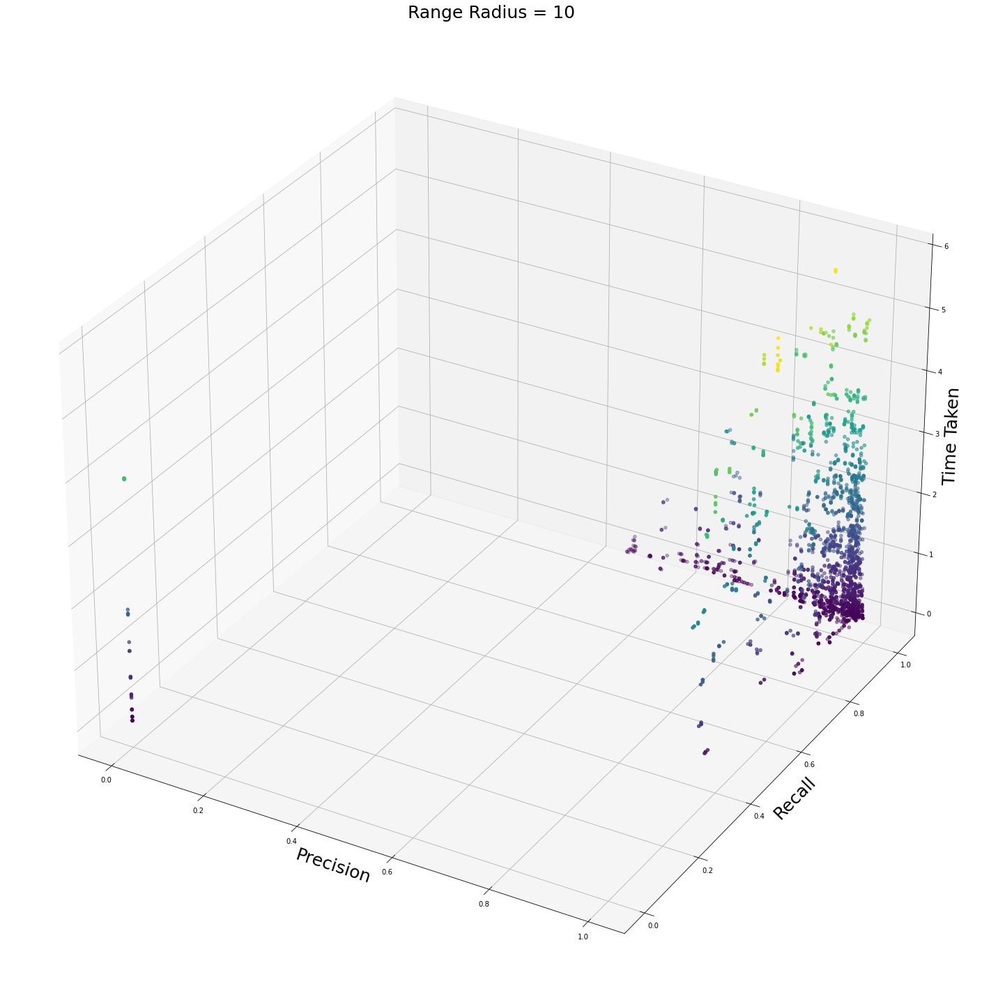

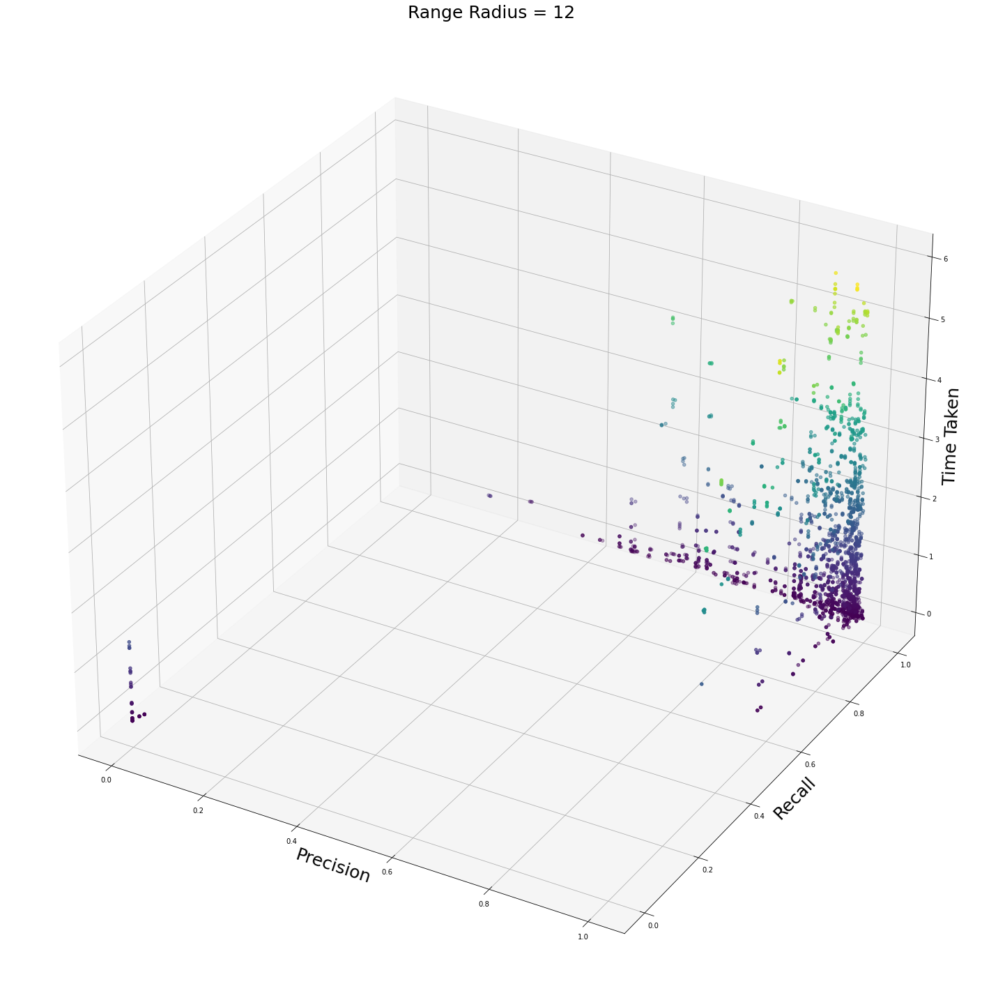

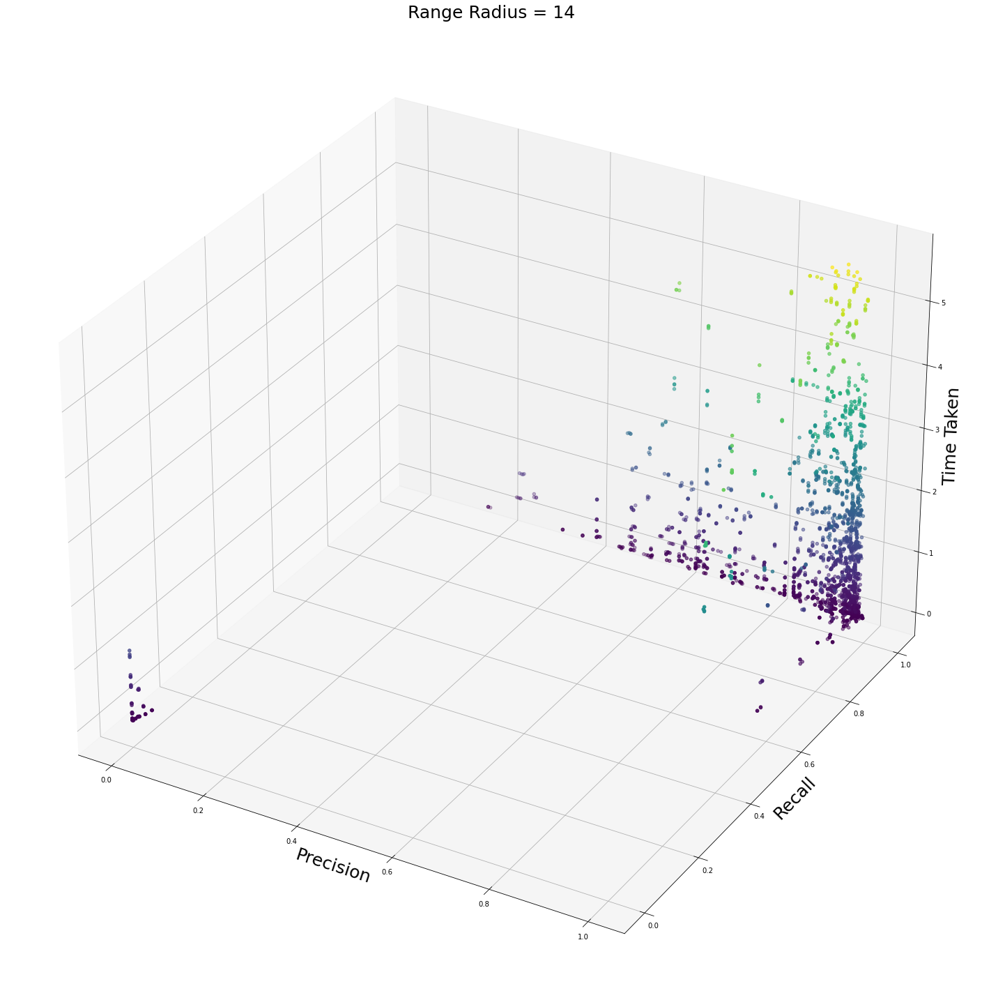

In [91]:
#make a 3d plot of the result for precision, recall and time taken for each range_radius
for i in rr_array:
    fig = plt.figure(figsize=(25, 30))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(results['precision'][results['range_radius'] == i], results['recall'][results['range_radius'] == i], results['time_taken'][results['range_radius'] == i], c=results['time_taken'][results['range_radius'] == i], cmap='viridis')
    ax.set_xlabel('Precision', fontsize=25)
    ax.set_ylabel('Recall', fontsize=25)
    ax.set_zlabel('Time Taken', fontsize=25)
    ax.set_title('Range Radius = ' + str(i), fontsize=25)
    plt.show()

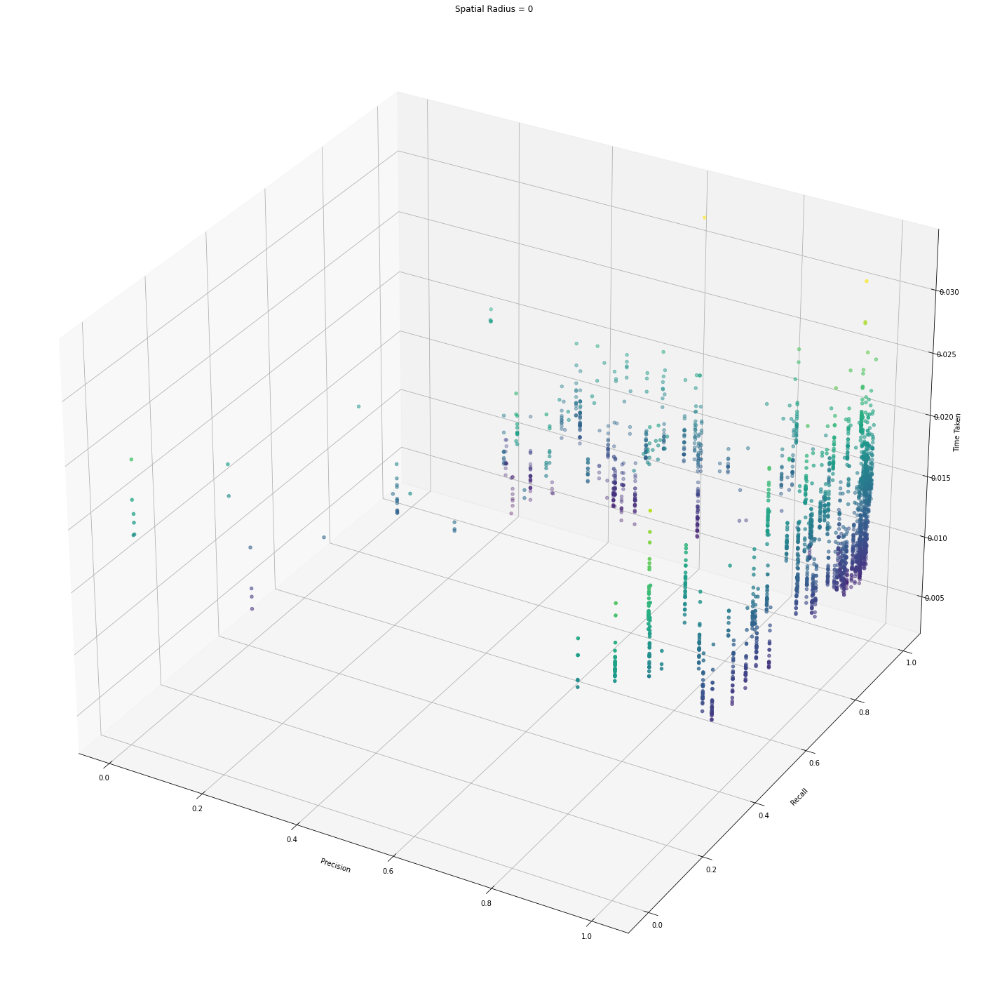

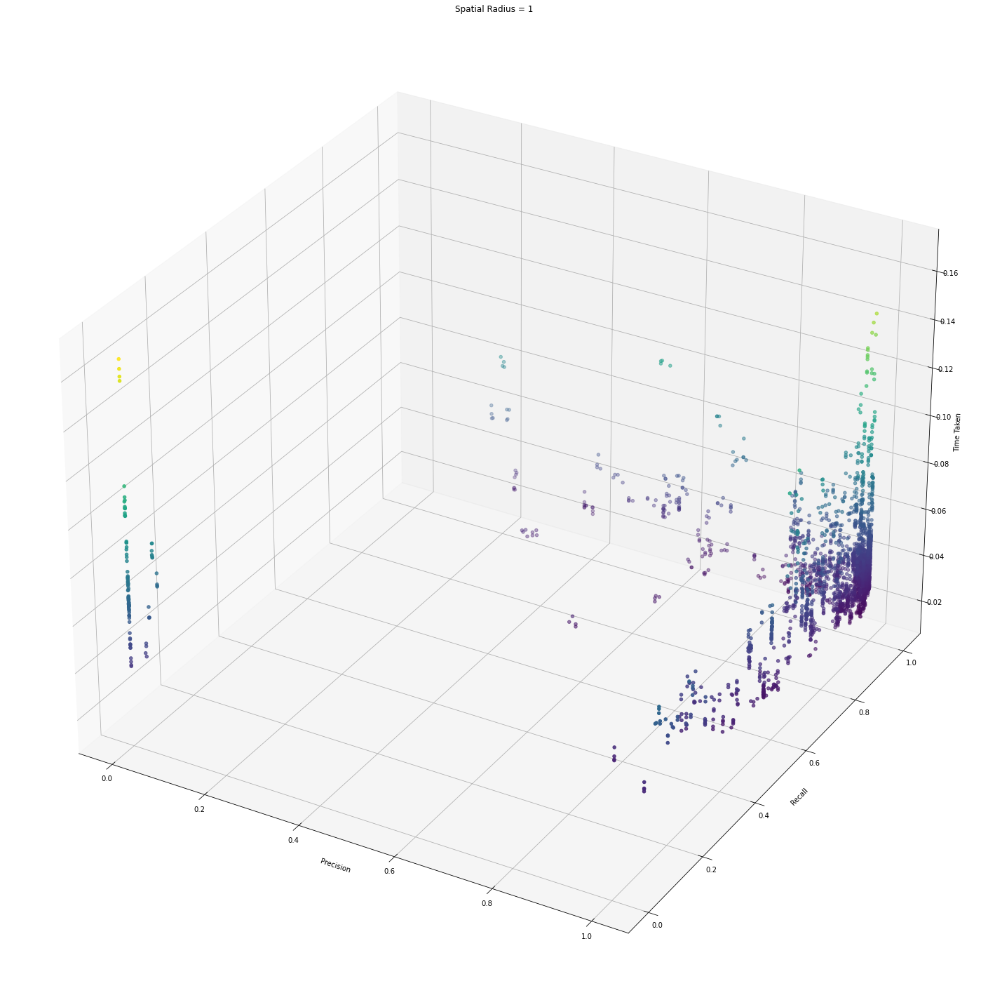

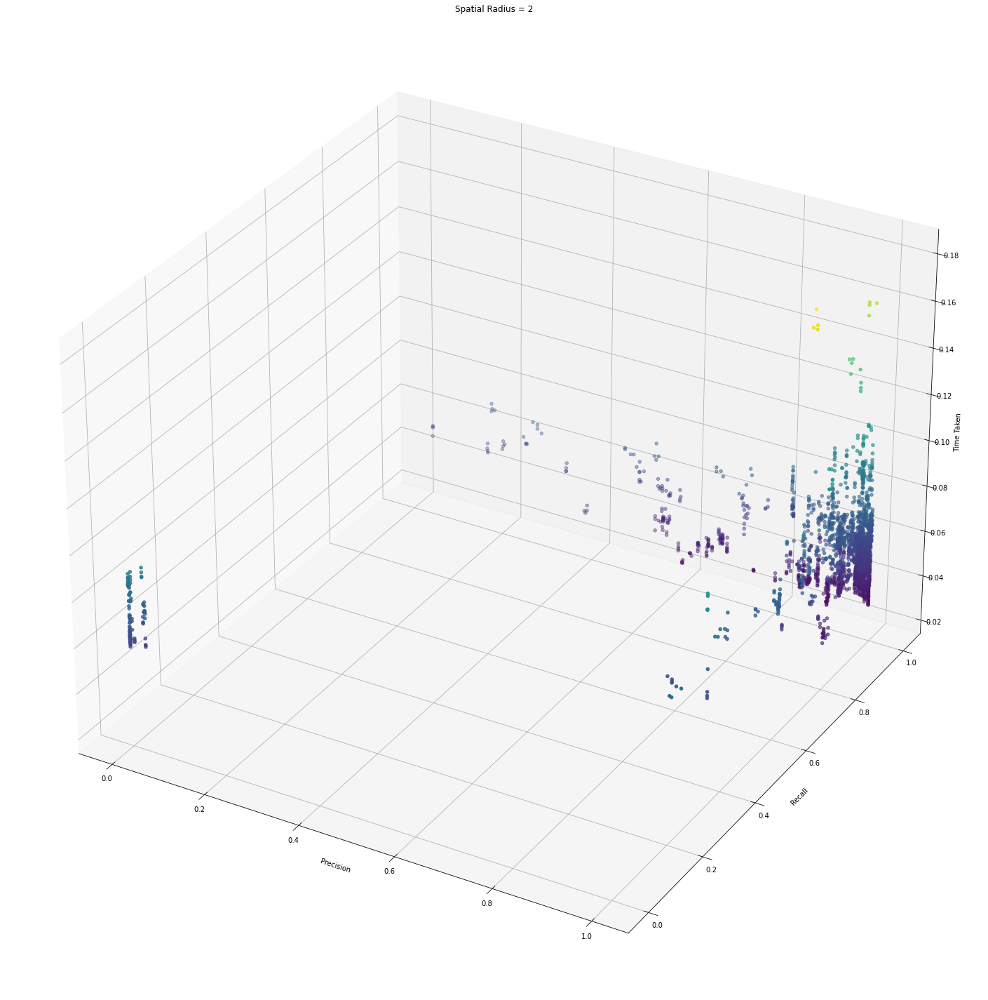

In [10]:
#make a 3d plot of the result for precision, recall and time taken for each spatial_radius
for i in sr_array:
    fig = plt.figure(figsize=(25, 30))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(results['precision'][results['spatial_radius'] == i], results['recall'][results['spatial_radius'] == i], results['time_taken'][results['spatial_radius'] == i], c=results['time_taken'][results['spatial_radius'] == i], cmap='viridis')
    ax.set_xlabel('Precision')
    ax.set_ylabel('Recall')
    ax.set_zlabel('Time Taken')
    ax.set_title('Spatial Radius = ' + str(i))
    plt.show()

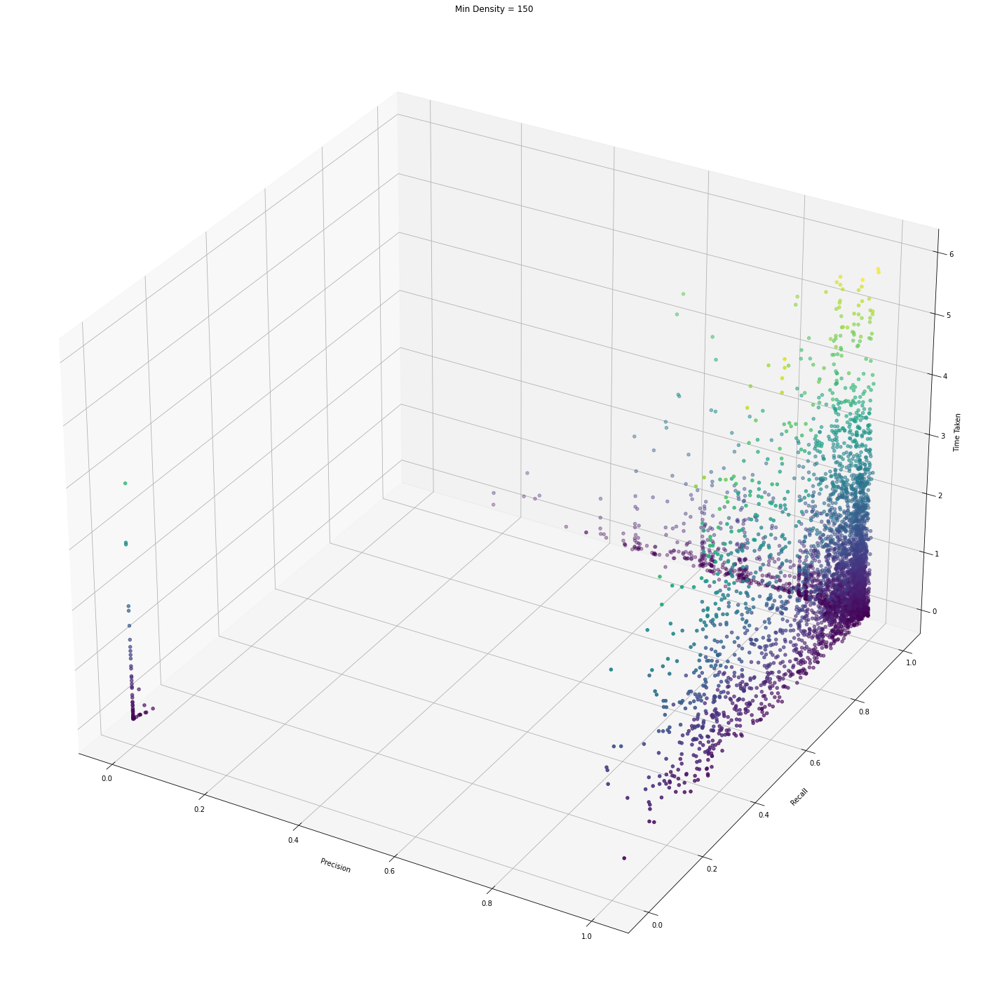

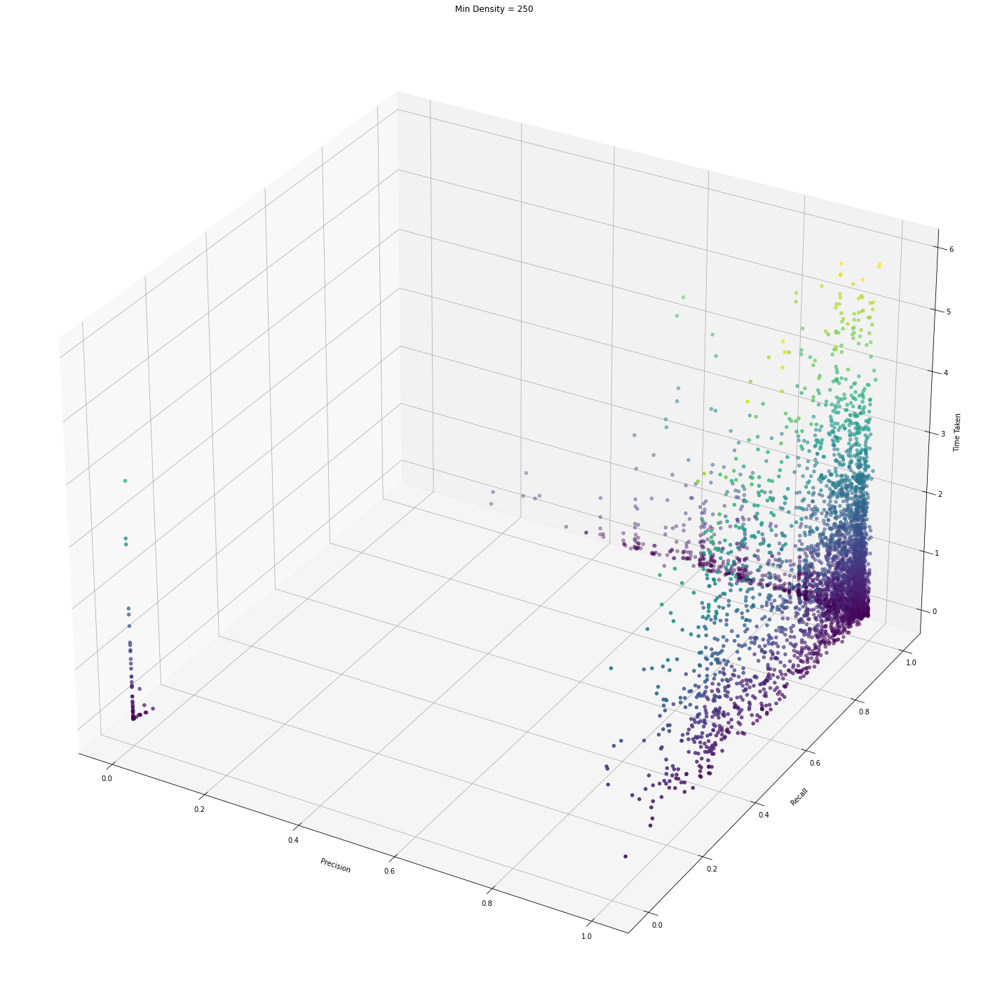

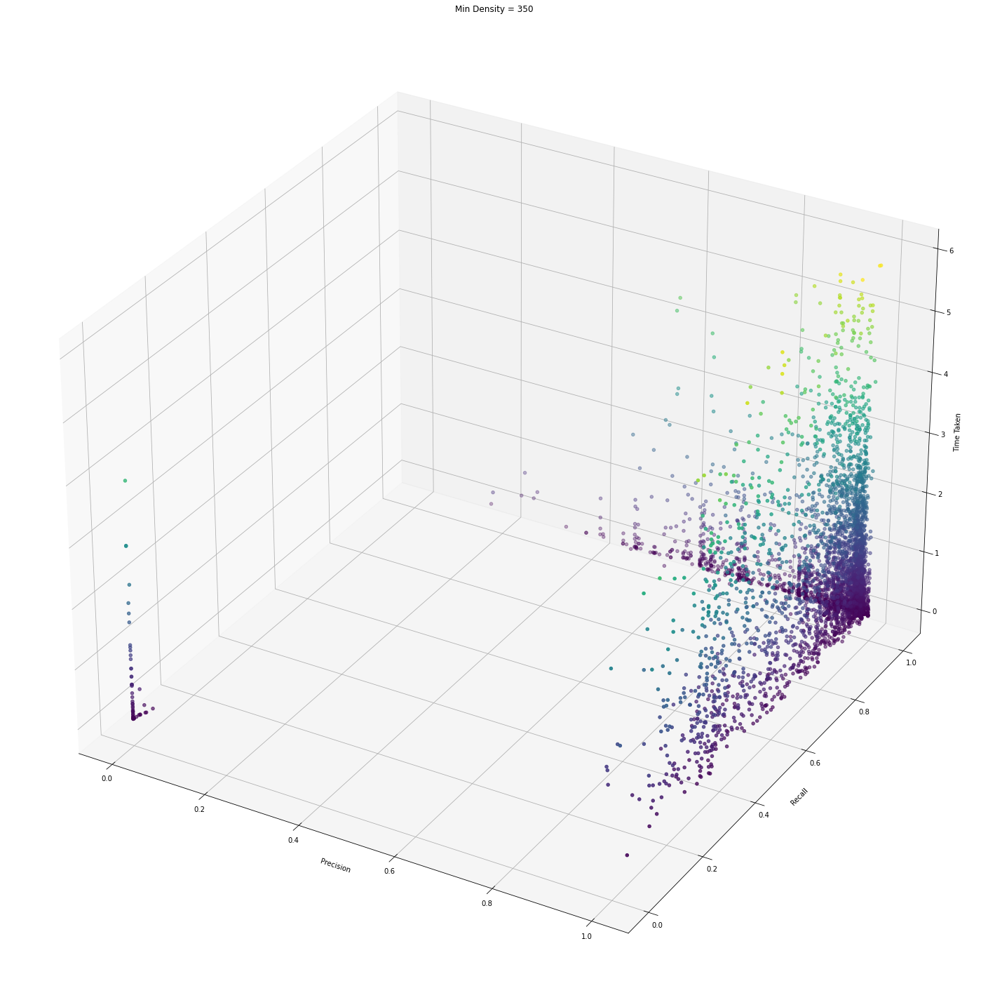

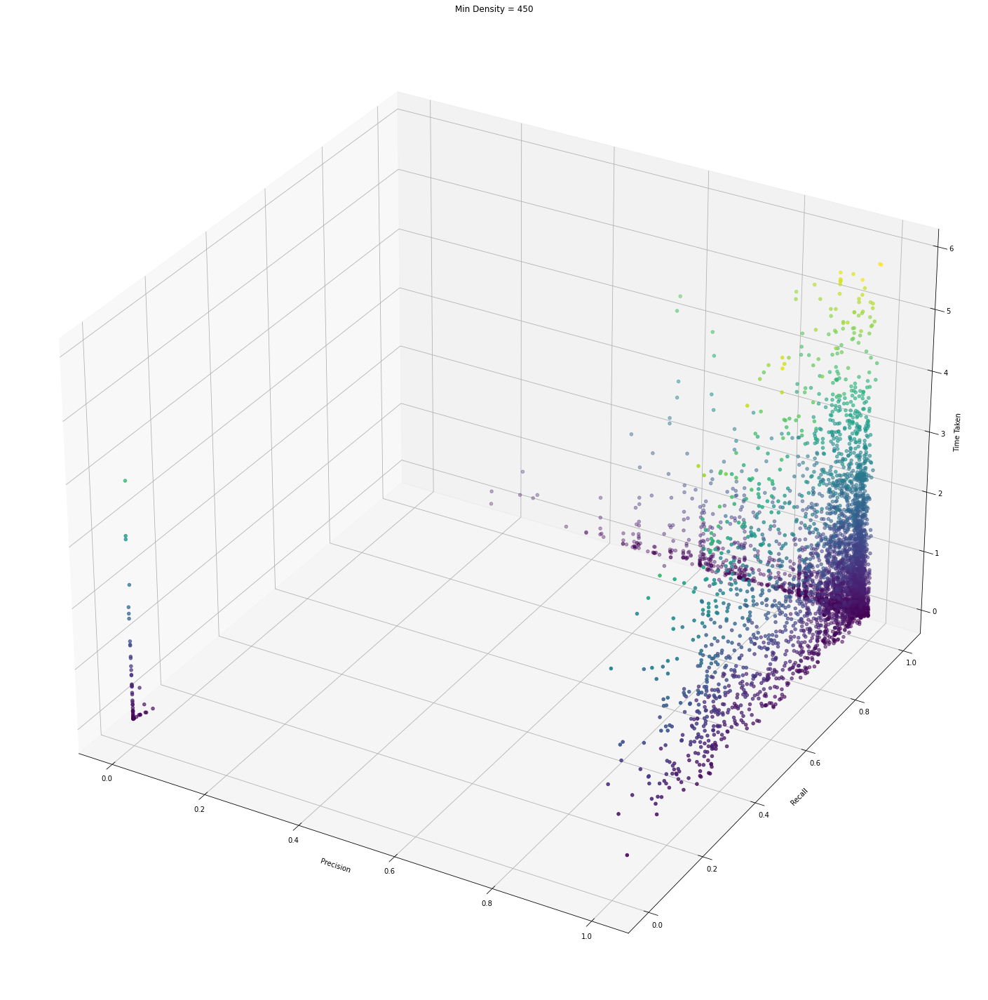

In [10]:
#make a 3d plot of the result for precision, recall and time taken for each min_density
for i in min_array:
    fig = plt.figure(figsize=(25, 30))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(results['precision'][results['min_density'] == i], results['recall'][results['min_density'] == i], results['time_taken'][results['min_density'] == i], c=results['time_taken'][results['min_density'] == i], cmap='viridis')
    ax.set_xlabel('Precision')
    ax.set_ylabel('Recall')
    ax.set_zlabel('Time Taken')
    ax.set_title('Min Density = ' + str(i))
    plt.show()

### Define Score function and convert data

In [94]:
#define a function that takes precision, recall and time taken and return a non-linear combined weighted score
def score(precision, recall, time_taken):
    return (precision * recall) / (time_taken + 0.1)  #add something super small

#add a column to the results dataframe with the score
results['score'] = [score(precision, recall, time_taken) for precision, recall, time_taken in zip(results['precision'], results['recall'], results['time_taken'])]

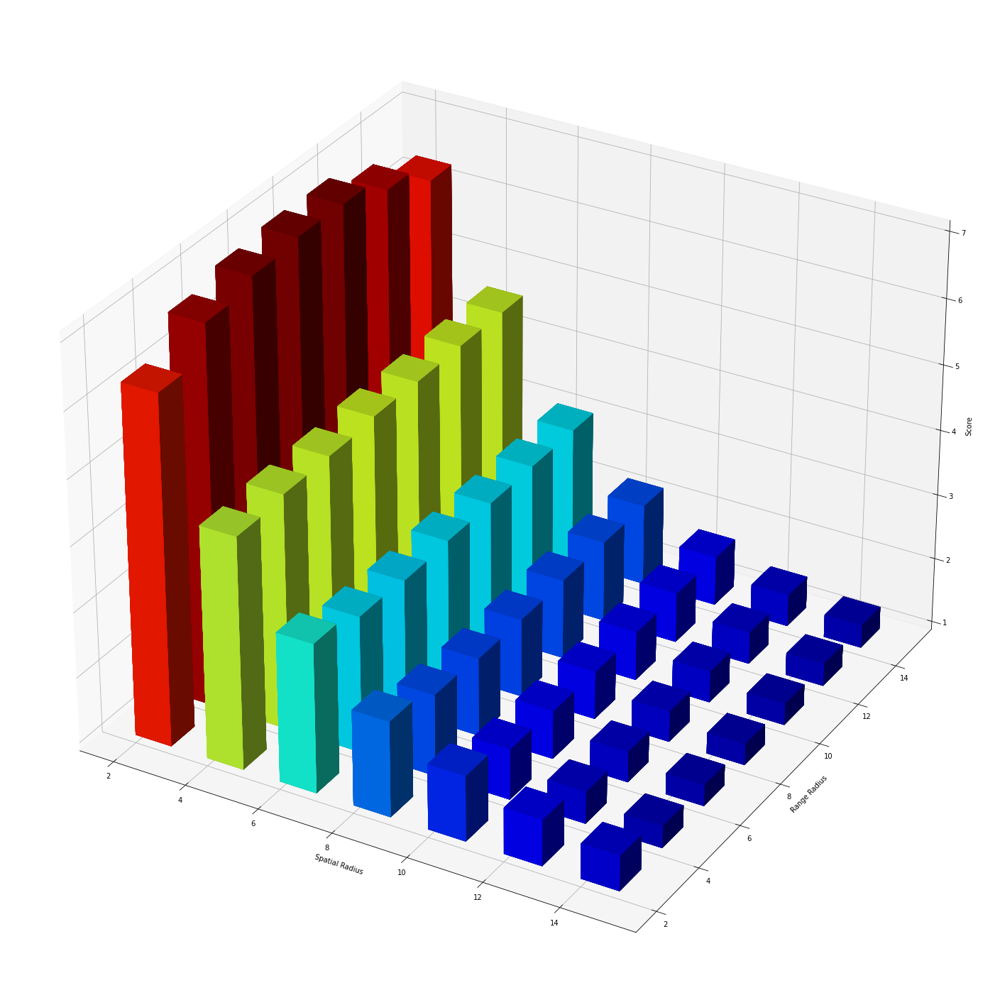

In [95]:
#get the average score for each spatial_radius, range_radius, and min_density and plot these values
score_array = []
for i in sr_array:
    for j in rr_array:
        for k in min_array:
            score_array.append([i, j, k, np.mean([l[8] for l in [m for m in [n for n in results.values if n[5] == i] if m[6] == j] if l[7] == k])])

#for each spatial_radius and range_radius, take the mean score value
score_array = [[i[0], i[1], np.mean([j[3] for j in [k for k in score_array if k[0] == i[0]] if j[1] == i[1]])] for i in score_array]

from matplotlib import cm

cmap = cm.get_cmap('jet')
#get the max and min score
max_score = max([k[2] for k in score_array])
min_score = min([k[2] for k in score_array])
rgba = [cmap((k[2])/max_score) for k in score_array] 

#plot a 3D bar plot of the score for each x axis as spatial_radius, y axis as range_radius, and z axis as score
fig = plt.figure(figsize=(25, 30))
ax = fig.add_subplot(111, projection='3d')
ax.bar3d([i[0] for i in score_array], [i[1] for i in score_array], 1, 1, 1, [i[2] for i in score_array], color=rgba)
ax.set_xlabel('Spatial Radius')
ax.set_ylabel('Range Radius')
ax.set_zlabel('Score')
plt.show()

------------------------------------------------------------------------------------------------------------------------
Processing: 7233, spatial_radius: 2, range_radius: 12, min_density: 350
Time taken:  0.05899977684020996


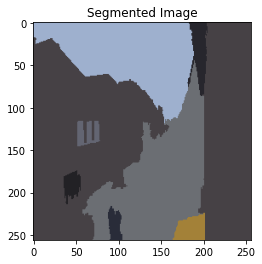

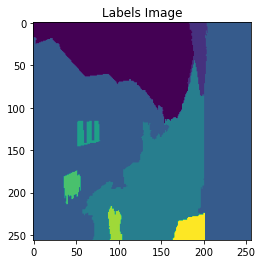

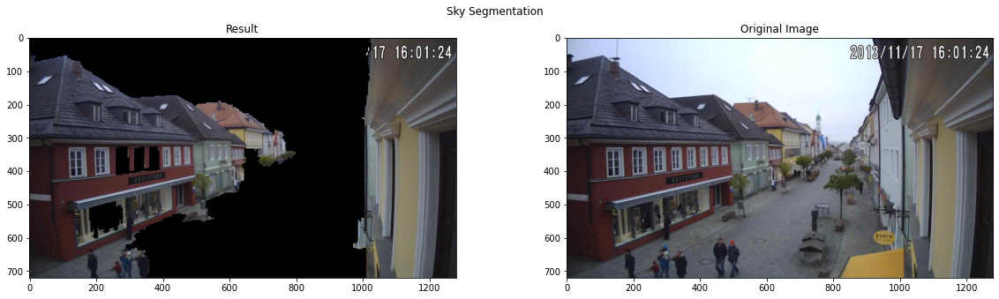

Precision: 5.966587112171838e-06
Recall: 1.9582373253089118e-05
F1: 9.146355406029583e-06
------------------------------------------------------------------------------------------------------------------------


In [32]:
#show the results for the lowest score values
for i in results.sort_values(by=['score'], ascending=True).head(1).values:
    display_results(i[3], display_mode = 'display' ,data_mode='validate', spatial_radius=i[5], range_radius=i[6], min_density=i[7])

------------------------------------------------------------------------------------------------------------------------
Processing: 75, spatial_radius: 2, range_radius: 14, min_density: 250
Time taken:  0.03799939155578613


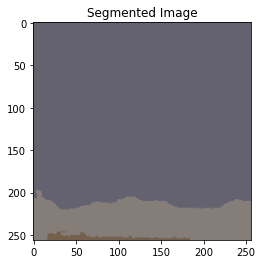

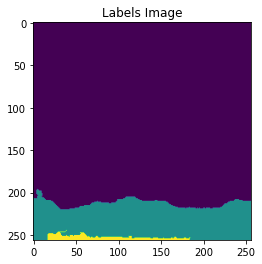

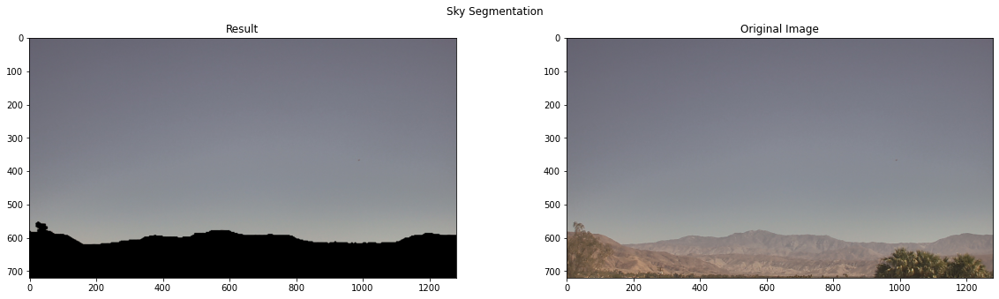

Precision: 0.997141468563993
Recall: 0.9981938764433621
F1: 0.9976673949657822
------------------------------------------------------------------------------------------------------------------------


In [33]:
#show the scores for the highest score values
for i in results.sort_values(by=['score'], ascending=False).head(1).values:
    display_results(i[3], display_mode = 'display' ,data_mode='validate', spatial_radius=i[5], range_radius=i[6], min_density=i[7])

### Mean Shift Segmentation for Video

In [38]:
cap = cv2.VideoCapture('C:\\Users\\cjbla\\OneDrive\\Desktop\\Code\\data\\dataset\\video_4.mp4')
result = cv2.VideoWriter('saved_video_4.avi', cv2.VideoWriter_fourcc(*'MJPG'), 10, (int(cap.get(3)), int(cap.get(4))))

counter = 0

while cap.isOpened():
    ret, frame = cap.read()
    if ret == True:
        if counter % 2 == 0:
            start_time = time.time()
            frame = cv2.rotate(frame, cv2.ROTATE_180)
            mask, segmented_image, labels_image = mean_shift(frame, spatial_radius=7, range_radius=7, min_density=200)
            after_img = cv2.bitwise_and(frame, frame, mask=mask)
            segmented_image = cv2.resize(segmented_image, (int(cap.get(3)), int(cap.get(4))))
            result.write(after_img)
            print("Time taken: ", time.time() - start_time, "s")
        counter += 1
    else:
        break

Time taken:  0.6514055728912354 s
Time taken:  0.6562507152557373 s
Time taken:  0.6336736679077148 s
Time taken:  0.6221697330474854 s
Time taken:  0.6465859413146973 s
Time taken:  0.6549358367919922 s
Time taken:  0.6382110118865967 s
Time taken:  0.6216704845428467 s
Time taken:  0.6381237506866455 s
Time taken:  0.645172119140625 s
Time taken:  0.6450247764587402 s
Time taken:  0.6286699771881104 s
Time taken:  0.6331276893615723 s
Time taken:  0.6510655879974365 s
Time taken:  0.6513335704803467 s
Time taken:  0.6392295360565186 s
Time taken:  0.6330990791320801 s
Time taken:  0.6451401710510254 s
Time taken:  0.6240947246551514 s
Time taken:  0.6426117420196533 s
Time taken:  0.6170978546142578 s
Time taken:  0.6371481418609619 s
Time taken:  0.6230912208557129 s
Time taken:  0.6251082420349121 s
Time taken:  0.6321203708648682 s
Time taken:  0.6311004161834717 s
Time taken:  0.6286320686340332 s
Time taken:  0.6391017436981201 s
Time taken:  0.6341376304626465 s
Time taken:  0.

#### Metrics: Precision, Recall, F1-Score

In [8]:
def plot_all_varaitions(results, sort_by, sr, rr, min):
    #sort (0 = Precision, 1 = Recall, 2 = F1)
    results.sort(key=lambda x: x[sort_by])

    #display the subplots for all metrics in one plot
    fig, axs = plt.subplots(3, 1, figsize=(30, 10))
    axs[0].plot([i[0] for i in results], label="Precision")
    axs[0].set_title('Precision, Spatial Radius = ' + str(sr) + ', Range Radius = ' + str(rr) +', Min Density = ' + str(min))
    axs[1].plot([i[1] for i in results], label="Recall", color='orange')
    axs[1].set_title('Recall, Spatial Radius = ' + str(sr) + ', Range Radius = ' + str(rr) +', Min Density = ' + str(min))
    axs[2].plot([i[2] for i in results], label="F1", color='green')
    axs[2].set_title('F1, Spatial Radius = ' + str(sr) + ', Range Radius = ' + str(rr) +', Min Density = ' + str(min))
    plt.show()

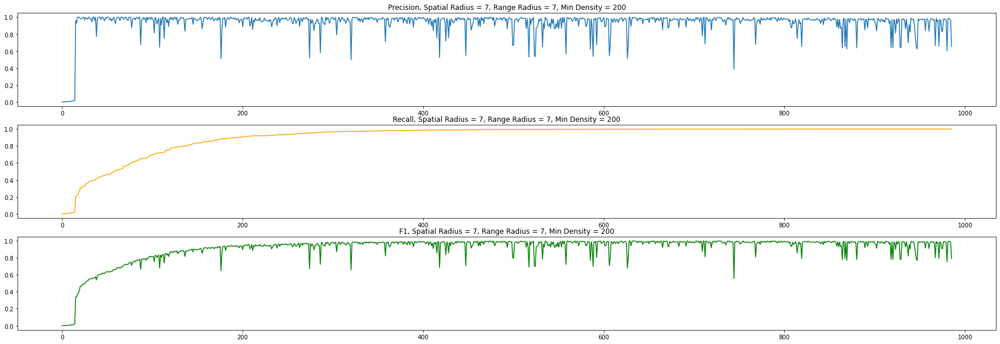

In [9]:
plot_all_varaitions(acc_7_7_200, 1, 7, 7, 200)

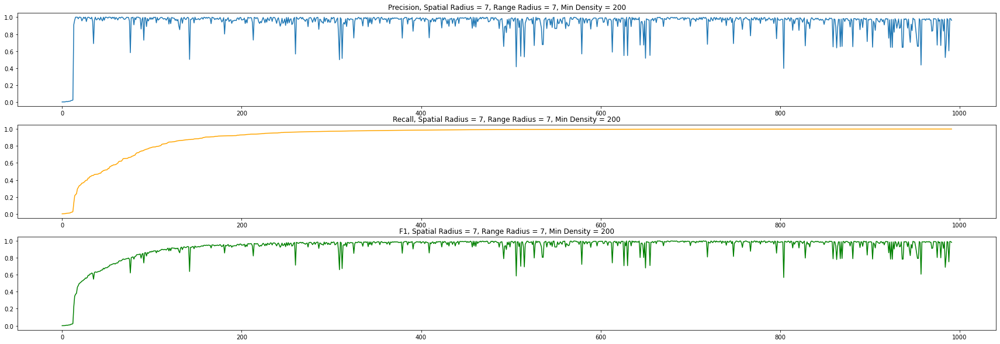

In [10]:
plot_all_varaitions(acc_5_6_100, 1, 5, 6, 100)

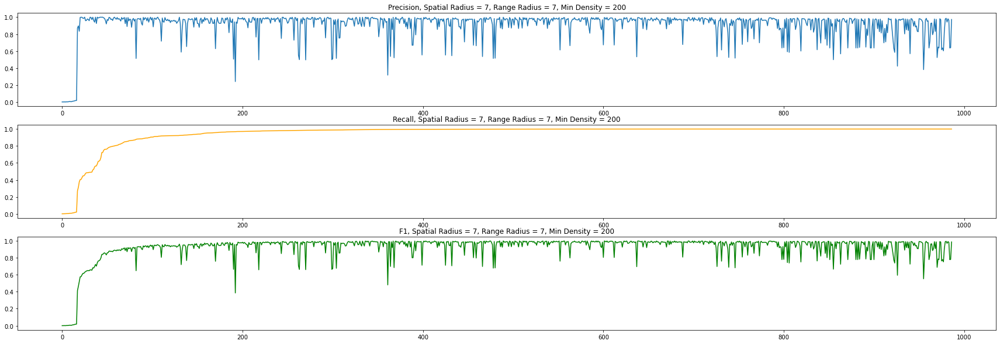

In [11]:
plot_all_varaitions(acc_5_8_300, 1, 5, 8, 300)

### Show worst 10 images

Worst 10 images based on precision: 
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 7, range_radius: 7, min_density: 200
Time taken:  0.7253754138946533


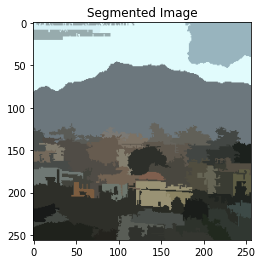

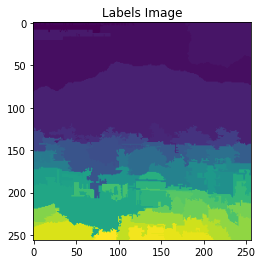

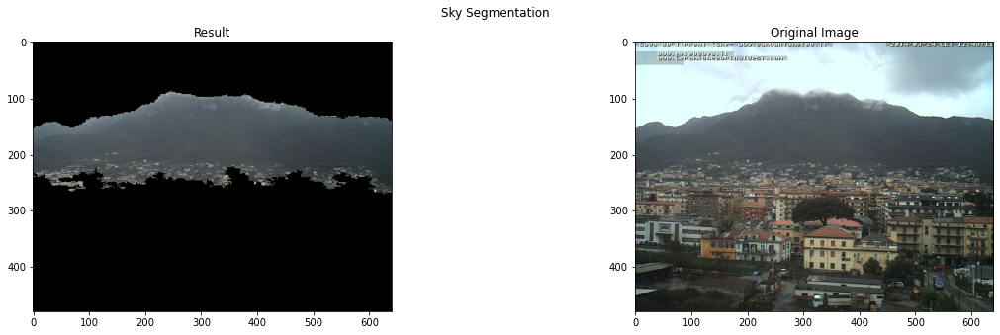

Precision: 0.00024740227610094015
Recall: 0.0003064711380805713
F1: 0.00027378695268276995
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Processing: 260, spatial_radius: 7, range_radius: 7, min_density: 200
Time taken:  0.8529002666473389


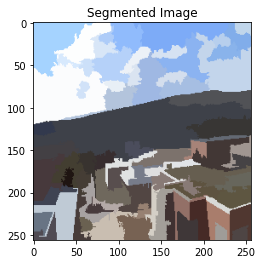

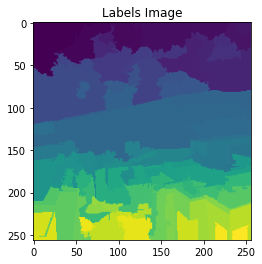

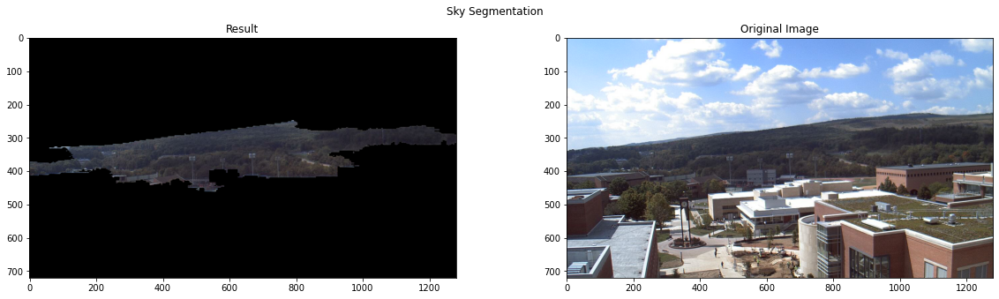

Precision: 0.0003417236853346174
Recall: 0.00012699842117871852
F1: 0.00018517739152392577
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Processing: 19306, spatial_radius: 7, range_radius: 7, min_density: 200
Time taken:  0.8245275020599365


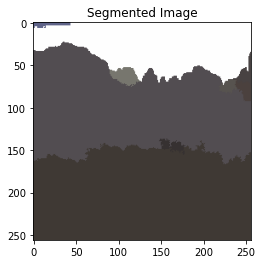

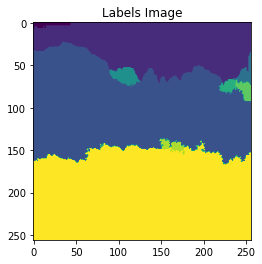

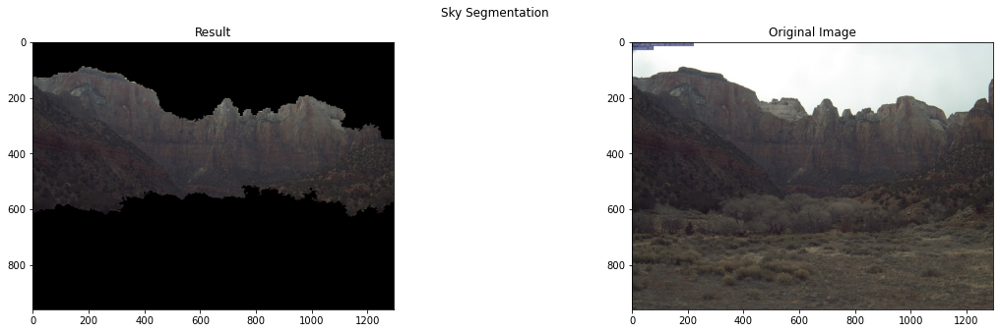

Precision: 0.0003461412726460791
Recall: 0.0006790630606461998
F1: 0.00045854615394413386
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Processing: 19306, spatial_radius: 7, range_radius: 7, min_density: 200
Time taken:  0.8926181793212891


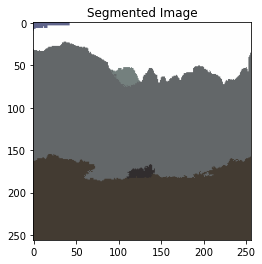

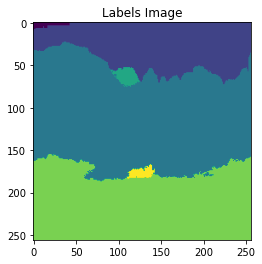

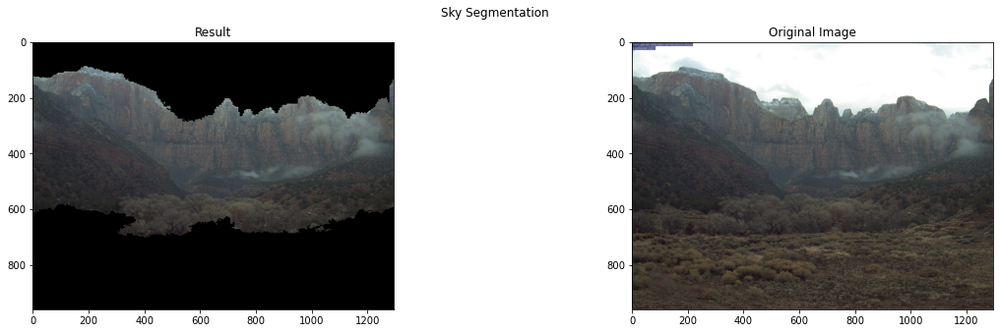

Precision: 0.0007040367060698267
Recall: 0.001718616388055197
F1: 0.000998879306144326
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Processing: 260, spatial_radius: 7, range_radius: 7, min_density: 200
Time taken:  0.9218437671661377


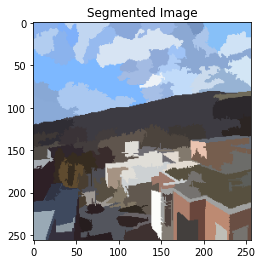

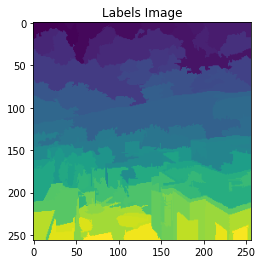

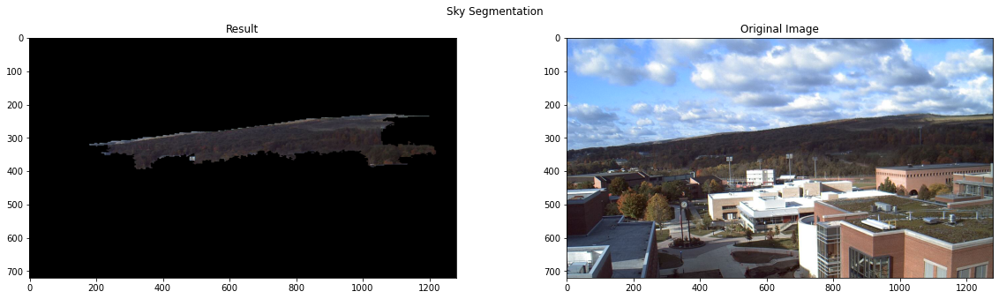

Precision: 0.0007714821028397889
Recall: 0.00018183864850589244
F1: 0.00029430863165172546
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 7, range_radius: 7, min_density: 200
Time taken:  0.8494315147399902


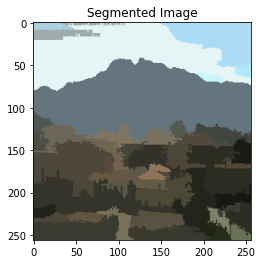

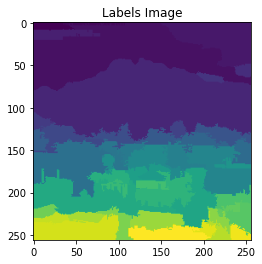

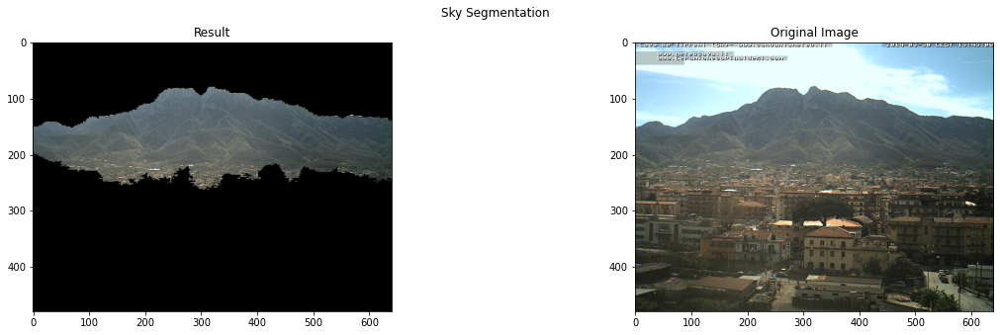

Precision: 0.002320763623013584
Recall: 0.0027122695720130556
F1: 0.0025012895065959144
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 7, range_radius: 7, min_density: 200
Time taken:  0.7171225547790527


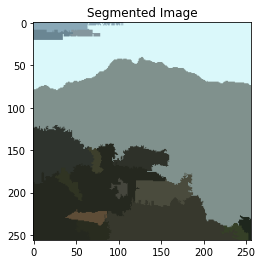

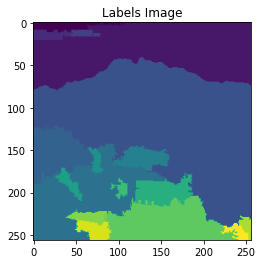

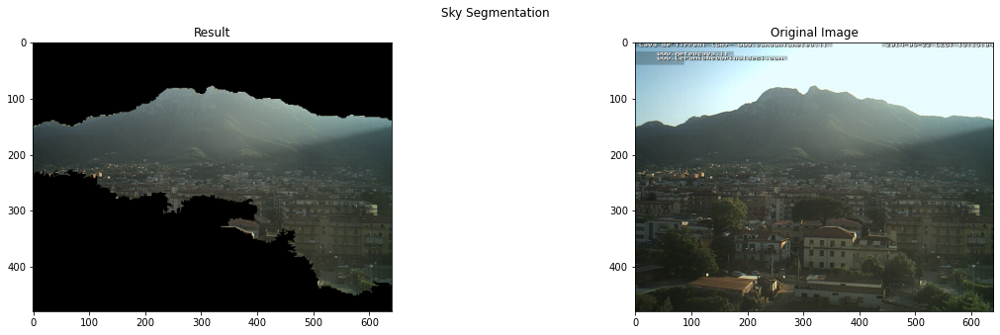

Precision: 0.0035550730510172097
Recall: 0.007125453960373282
F1: 0.004743494272103153
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 7, range_radius: 7, min_density: 200
Time taken:  0.7863407135009766


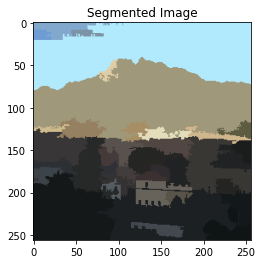

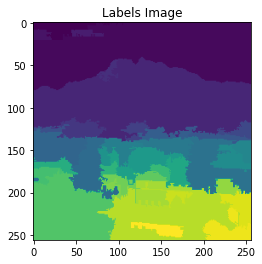

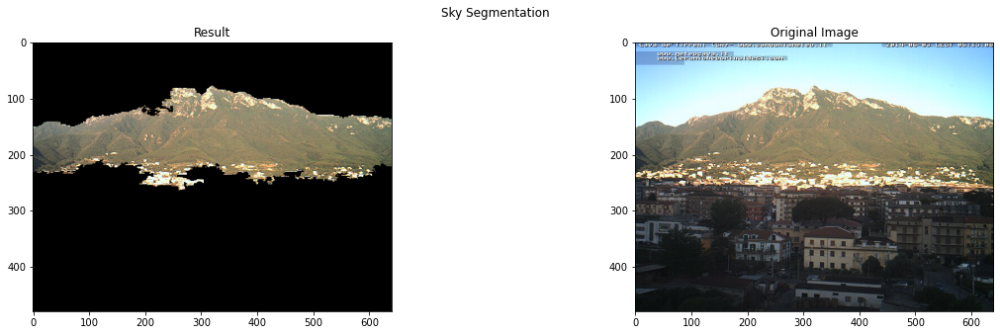

Precision: 0.004514702927188693
Recall: 0.005164038676657626
F1: 0.004817589204025618
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 7, range_radius: 7, min_density: 200
Time taken:  0.7206203937530518


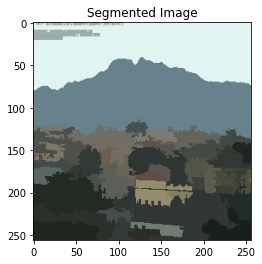

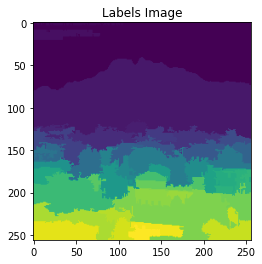

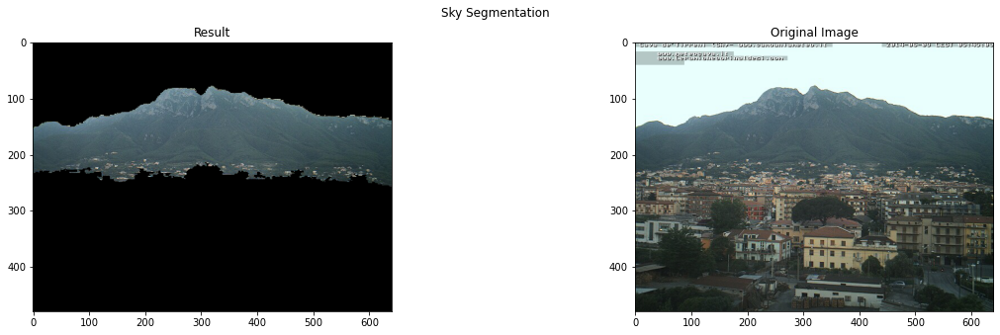

Precision: 0.0047310048861198
Recall: 0.005608421826874454
F1: 0.0051324839960454624
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
Processing: 9291, spatial_radius: 7, range_radius: 7, min_density: 200
Time taken:  0.7807824611663818


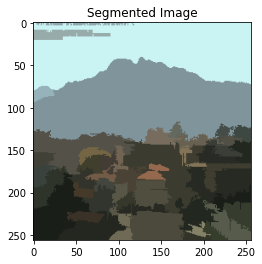

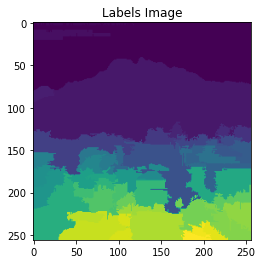

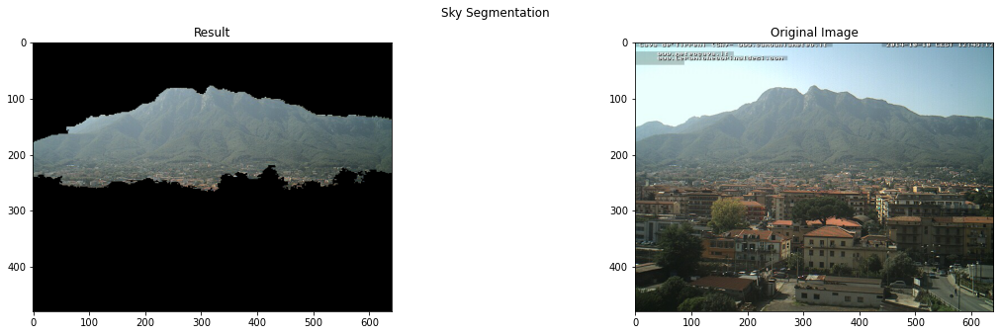

Precision: 0.0057269581322805475
Recall: 0.007202071744893425
F1: 0.0063803647668112425
------------------------------------------------------------------------------------------------------------------------


In [12]:
#print the worst 10 images based on precision using filenames on 4th column
acc_7_7_200.sort(key=lambda x: x[0])
print("Worst 10 images based on precision: ")
for i in range(0, 10):
    _ = display_results(acc_7_7_200[i][3], display_mode = 'display' ,data_mode='validate', spatial_radius=7, range_radius=7, min_density=200)

### Save Results

In [30]:
import csv

#save the results in a csv file for each
with open('acc_7_7_200.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Precision", "Recall", "F1", "Image", "Time"])
    writer.writerows(acc_7_7_200)

with open('acc_5_6_100.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Precision", "Recall", "F1", "Image", "Time"])
    writer.writerows(acc_5_6_100)

with open('acc_5_8_300.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Precision", "Recall", "F1", "Image", "Time"])
    writer.writerows(acc_5_8_300)